In [1]:
!pip install zarr
!pip install pymap3d
!pip install transforms3d
!pip install protobuf==3.20.3

In [2]:
# !git clone https://github.com/woven-planet/l5kit.git
# !cd l5kit/l5kit

In [3]:
import os
print(os.listdir('/content/l5kit'))
print(os.listdir('/content/l5kit/l5kit'))
print(os.listdir('/content/l5kit/l5kit/l5kit/configs'))

['README.md', 'l5kit', '.git', 'examples', '.gitignore', 'dataset_metadata', 'scripts', '.github', 'docs']
['l5kit', '.pre-commit-config.yaml', '.coveragerc', 'run_tests.sh', 'Pipfile.lock', 'pyproject.toml', 'setup.py', '.flake8', 'Pipfile', '.mypy.ini']
['__init__.py', '__pycache__', 'config.py']


In [4]:
from typing import Dict

from tempfile import gettempdir
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.models.resnet import resnet50
from tqdm import tqdm


import sys
sys.path.append('/content/l5kit/l5kit')

from l5kit.configs import load_config_data
from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, read_gt_csv, create_chopped_dataset
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace
from l5kit.geometry import transform_points
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from prettytable import PrettyTable
from pathlib import Path

import os

In [16]:
#import tarfile

# Path to the tar file
#tar_file_path = '/content/sample_data/prediction-sample.tar'

#destination_folder = '/content/sample_data/prediction-dataset/scenes'

# Open and extract the tar file
#try:
#     with tarfile.open(tar_file_path, 'r:*') as tar:
#         tar.extractall(path=destination_folder)
#         print(f"Extracted all files to {destination_folder}")
#except Exception as e:
#     print(f"An error occurred: {e}")

Extracted all files to /content/sample_data/prediction-dataset/scenes


## Prepare Data path and load cfg

By setting the `L5KIT_DATA_FOLDER` variable, we can point the script to the folder where the data lies.

Then, we load our config file with relative paths and other configurations (rasteriser, training params...).

In [6]:
#sys.path.append('/content/l5kit/examples/agent_motion_prediction')
# set env variable for data
os.environ["L5KIT_DATA_FOLDER"] = "/content/l5kit/examples/agent_motion_prediction/prediction-dataset"
dm = LocalDataManager(None)
# get config


cfg = load_config_data("/content/l5kit/examples/agent_motion_prediction/agent_motion_config.yaml")
print(cfg)

{'format_version': 4, 'model_params': {'model_architecture': 'resnet50', 'history_num_frames': 0, 'future_num_frames': 50, 'step_time': 0.1, 'render_ego_history': True}, 'raster_params': {'raster_size': [224, 224], 'pixel_size': [0.5, 0.5], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5, 'disable_traffic_light_faces': False, 'set_origin_to_bottom': True}, 'train_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 12, 'shuffle': True, 'num_workers': 16}, 'val_data_loader': {'key': 'scenes/sample.zarr', 'batch_size': 12, 'shuffle': False, 'num_workers': 16}, 'train_params': {'checkpoint_every_n_steps': 10000, 'max_num_steps': 5, 'eval_every_n_steps': 10000}}


## Model

Our baseline is a simple `resnet50` pretrained on `imagenet`. We must replace the input and the final layer to address our requirements.

In [7]:
def build_model(cfg: Dict) -> torch.nn.Module:
    # load pre-trained Conv2D model
    model = resnet50(pretrained=True)

    # change input channels number to match the rasterizer's output
    num_history_channels = (cfg["model_params"]["history_num_frames"] + 1) * 2
    num_in_channels = 3 + num_history_channels
    model.conv1 = nn.Conv2d(
        num_in_channels,
        model.conv1.out_channels,
        kernel_size=model.conv1.kernel_size,
        stride=model.conv1.stride,
        padding=model.conv1.padding,
        bias=False,
    )
    # change output size to (X, Y) * number of future states
    num_targets = 2 * cfg["model_params"]["future_num_frames"]
    model.fc = nn.Linear(in_features=2048, out_features=num_targets)

    return model

In [8]:
def forward(data, model, device, criterion):
    inputs = data["image"].to(device)
    target_availabilities = data["target_availabilities"].unsqueeze(-1).to(device)
    targets = data["target_positions"].to(device)
    # Forward pass
    outputs = model(inputs).reshape(targets.shape)
    loss = criterion(outputs, targets)
    # not all the output steps are valid, but we can filter them out from the loss using availabilities
    loss = loss * target_availabilities
    loss = loss.mean()
    return loss, outputs

In [42]:
def build_model(cfg: Dict) -> torch.nn.Module:
    # Load pre-trained Conv2D model
    model = resnet50(pretrained=True)

    # Change input channels number to match the rasterizer's output
    num_history_channels = (cfg["model_params"]["history_num_frames"] + 1) * 2
    num_in_channels = 3 + num_history_channels
    model.conv1 = nn.Conv2d(
        num_in_channels,
        model.conv1.out_channels,
        kernel_size=model.conv1.kernel_size,
        stride=model.conv1.stride,
        padding=model.conv1.padding,
        bias=False,
    )
    # Change output size to match target shape
    num_targets = cfg["model_params"]["future_num_frames"] * 2
    model.fc = nn.Linear(in_features=2048, out_features=num_targets)

    return model


In [43]:
def forward(data, model, device, criterion):
    inputs = data["image"].to(device)
    target_availabilities = data["target_availabilities"].unsqueeze(-1).to(device)
    targets = data["target_positions"].to(device)

    # Forward pass
    outputs = model(inputs).view(targets.size(0), targets.size(1), -1)  # Reshape to match target shape
    loss = criterion(outputs, targets)

    # Filter out invalid steps from the loss using availabilities
    loss = loss * target_availabilities
    loss = loss.mean()

    return loss, outputs


In [9]:
# import tarfile

# Path to the tar file
# tar_file_path = '/content/sample_data/prediction-semantic_map.tar'

# destination_folder = '/content/l5kit/examples/agent_motion_prediction/prediction-dataset/semantic_map'

# Open and extract the tar file
# try:
#     with tarfile.open(tar_file_path, 'r:*') as tar:
 #        tar.extractall(path=destination_folder)
 #        print(f"Extracted all files to {destination_folder}")
# except Exception as e:
 #    print(f"An error occurred: {e}")

## Load the Train Data

Our data pipeline map a raw `.zarr` folder into a multi-processing instance ready for training by:
- loading the `zarr` into a `ChunkedDataset` object. This object has a reference to the different arrays into the zarr (e.g. agents and traffic lights);
- wrapping the `ChunkedDataset` into an `AgentDataset`, which inherits from torch `Dataset` class;
- passing the `AgentDataset` into a torch `DataLoader`

In [44]:
import numpy as np

print(np.__version__)
np.float = float


1.26.4


In [11]:
# import zarr
# ===== INIT DATASET
# train_cfg = cfg["train_data_loader"]

#train_cfg["key"] = "/scenes/sample.zarr"

# Get the path of the zarr file using dm.require
# zarr_path = dm.require(train_cfg["key"])

# Open the zarr file in read mode
# zarr_file = zarr.open(zarr_path, mode='r')

# Print the keys (groups and arrays) in the zarr file
# print(zarr_file.tree())

In [53]:
# ===== INIT DATASET
train_cfg = cfg["train_data_loader"]
#train_cfg["key"] = "/scenes/sample.zarr"
rasterizer = build_rasterizer(cfg, dm)
train_zarr = ChunkedDataset(dm.require(train_cfg["key"])).open()
import numpy as np

print(np.__version__)
np.int = np.int64
train_dataset = AgentDataset(cfg, train_zarr, rasterizer)
#train_dataloader = DataLoader(train_dataset, shuffle=train_cfg["shuffle"], batch_size=train_cfg["batch_size"],
                           #  num_workers=train_cfg["num_workers"])

train_dataloader = DataLoader(train_dataset, shuffle=train_cfg["shuffle"], batch_size=train_cfg["batch_size"], num_workers=2)

print(train_dataset)

1.26.4
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   24838    |  1893736   |     316008    |       0.69      |        248.38        |        76.24         |        24.83         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


In [54]:
# ==== INIT MODEL
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = build_model(cfg).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.MSELoss(reduction="none")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Training

note: if you're on MacOS and using `py_satellite` rasterizer, you may need to disable opencv multiprocessing by adding:
`cv2.setNumThreads(0)` before the following cell. This seems to only affect running in python notebook and it's caused by the `cv2.warpaffine` function

In [55]:
import numpy as np

print(np.__version__)
np.int = np.int64
np.bool = np.bool_

# ==== TRAIN LOOP
tr_it = iter(train_dataloader)
progress_bar = tqdm(range(cfg["train_params"]["max_num_steps"]))
losses_train = []
for _ in progress_bar:
    try:
        data = next(tr_it)
    except StopIteration:
        tr_it = iter(train_dataloader)
        data = next(tr_it)
    model.train()
    torch.set_grad_enabled(True)
    loss, _ = forward(data, model, device, criterion)

    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    losses_train.append(loss.item())
    progress_bar.set_description(f"loss: {loss.item()} loss(avg): {np.mean(losses_train)}")

1.26.4



  0%|          | 0/5 [00:00<?, ?it/s]
loss: 45.8233528137207 loss(avg): 45.8233528137207:   0%|          | 0/5 [00:18<?, ?it/s]
loss: 45.8233528137207 loss(avg): 45.8233528137207:  20%|██        | 1/5 [00:18<01:15, 18.79s/it]
loss: 53.13825988769531 loss(avg): 49.48080635070801:  20%|██        | 1/5 [00:26<01:15, 18.79s/it]
loss: 53.13825988769531 loss(avg): 49.48080635070801:  40%|████      | 2/5 [00:26<00:37, 12.54s/it]
loss: 115.07959747314453 loss(avg): 71.34707005818684:  40%|████      | 2/5 [00:38<00:37, 12.54s/it]
loss: 115.07959747314453 loss(avg): 71.34707005818684:  60%|██████    | 3/5 [00:38<00:24, 12.21s/it]
loss: 74.38398742675781 loss(avg): 72.10629940032959:  60%|██████    | 3/5 [00:49<00:24, 12.21s/it] 
loss: 74.38398742675781 loss(avg): 72.10629940032959:  80%|████████  | 4/5 [00:49<00:11, 11.45s/it]
loss: 146.3046417236328 loss(avg): 86.94596786499024:  80%|████████  | 4/5 [00:57<00:11, 11.45s/it]
loss: 146.3046417236328 loss(avg): 86.94596786499024: 100%|██████████|

In [56]:
#def define_tasks(dataset):
#            task_1 = DataLoader(dataset, batch_size=train_cfg["batch_size"], shuffle=True, num_workers=train_cfg["num_workers"])
#           task_2 = DataLoader(dataset, batch_size=train_cfg["batch_size"], shuffle=True, num_workers=train_cfg["num_workers"])
#           task_3 = DataLoader(dataset, batch_size=train_cfg["batch_size"], shuffle=True, num_workers=train_cfg["num_workers"])
#            return [task_1, task_2, task_3]

#tasks = define_tasks(train_dataset)

In [ ]:
from torch.utils.data import DataLoader

# Filter function to split dataset based on mean FV speed
def filter_dataset_by_speed(dataset, speed_range):
    filtered_indices = []
    for idx, data in enumerate(dataset):
        mean_speed = data["mean_fv_speed"]  # Assuming `mean_fv_speed` is a key in the dataset
        if speed_range[0] <= mean_speed <= speed_range[1]:
            filtered_indices.append(idx)
    return torch.utils.data.Subset(dataset, filtered_indices)

# Define tasks with different speed ranges
task_1_dataset = filter_dataset_by_speed(train_dataset, (12.46, float('inf')))
task_2_dataset = filter_dataset_by_speed(train_dataset, (9.86, 12.46))
task_3_dataset = filter_dataset_by_speed(train_dataset, (0, 9.86))

task_1_loader = DataLoader(task_1_dataset, batch_size=train_cfg["batch_size"], shuffle=True, num_workers=2)
task_2_loader = DataLoader(task_2_dataset, batch_size=train_cfg["batch_size"], shuffle=True, num_workers=2)
task_3_loader = DataLoader(task_3_dataset, batch_size=train_cfg["batch_size"], shuffle=True, num_workers=2)

tasks = [task_1_loader, task_2_loader, task_3_loader]

In [51]:
#import copy
#from torch.autograd import Variable

#class EWC:
 #   def __init__(self, model, dataset, criterion, device):
  #      self.model = model
 #       self.dataset = dataset
  #      self.criterion = criterion
 #       self.device = device
 #       self.params = {n: p.clone().detach() for n, p in model.named_parameters() if p.requires_grad}
  #      self._precision_matrices = self._compute_fisher_information()

  #  def _compute_fisher_information(self):
  #      precision_matrices = {n: torch.zeros_like(p, device=self.device) for n, p in self.params.items()}
  #      self.model.eval()
  #      for data in self.dataset:
 #           self.model.zero_grad()
   #         inputs = data["image"].to(self.device)
  #          targets = data["target_positions"].to(self.device)
 #           outputs = self.model(inputs).view(targets.size(0), targets.size(1), -1)
  #          loss = self.criterion(outputs, targets)
  #          loss = loss.mean()
   #         loss.backward()
   #         for n, p in self.model.named_parameters():
  #              if p.grad is not None:
 #                   precision_matrices[n] += (p.grad ** 2) / len(self.dataset)
  #      return precision_matrices

#    def penalty(self, model):
 #       loss = 0
   #     for n, p in model.named_parameters():
  #          if n in self._precision_matrices:
   #             _loss = self._precision_matrices[n] * (p - self.params[n]) ** 2
 #               loss += _loss.sum()
 #       return loss

# Rehearsal memory for replay
#rehearsal_memory = []
#max_memory_size = 1000  # Define the maximum memory size

#def rehearsal_update(memory, new_data):
#    memory.extend(new_data)
 #   if len(memory) > max_memory_size:
 #       memory = memory[-max_memory_size:]
  #  return memory

In [ ]:
import copy
from torch.autograd import Variable

class EWC:
    def __init__(self, model, dataset, criterion, device):
        self.model = model
        self.dataset = dataset
        self.criterion = criterion
        self.device = device
        self.params = {n: p.clone().detach() for n, p in model.named_parameters() if p.requires_grad}
        self._precision_matrices = self._compute_fisher_information()

    def _compute_fisher_information(self):
        precision_matrices = {n: torch.zeros_like(p, device=self.device) for n, p in self.params.items()}
        self.model.eval()
        for data in self.dataset:
            self.model.zero_grad()
            inputs = data["image"].to(self.device)
            targets = data["target_positions"].to(self.device)
            outputs = self.model(inputs).view(targets.size(0), targets.size(1), -1)
            loss = self.criterion(outputs, targets)
            loss = loss.mean()
            loss.backward()
            for n, p in self.model.named_parameters():
                if p.grad is not None:
                    precision_matrices[n] += (p.grad ** 2) / len(self.dataset)
        return precision_matrices

    def penalty(self, model):
        loss = 0
        for n, p in model.named_parameters():
            if n in self._precision_matrices:
                _loss = self._precision_matrices[n] * (p - self.params[n]) ** 2
                loss += _loss.sum()
        return loss

# Rehearsal memory for replay
rehearsal_memory = []
max_memory_size = 1000  # Define the maximum memory size

def rehearsal_update(memory, new_data):
    memory.extend(new_data)
    if len(memory) > max_memory_size:
        memory = memory[-max_memory_size:]
    return memory

In [ ]:
for task_id, task_loader in enumerate(tasks):
    tr_it = iter(task_loader)
    progress_bar = tqdm(range(cfg["train_params"]["max_num_steps"]))
    ewc = EWC(model, task_loader, criterion, device)

    for _ in progress_bar:
        try:
            data = next(tr_it)
        except StopIteration:
            tr_it = iter(task_loader)
            data = next(tr_it)

        # Update rehearsal memory
        rehearsal_memory = rehearsal_update(rehearsal_memory, [data])

        # Rehearsal by adding data from memory
        replay_data = rehearsal_memory[np.random.randint(len(rehearsal_memory))]
        model.train()
        torch.set_grad_enabled(True)

        # Compute loss for current data
        loss, _ = forward(data, model, device, criterion)

        # Compute loss for rehearsal data
        replay_loss, _ = forward(replay_data, model, device, criterion)

        # EWC penalty
        ewc_loss = ewc.penalty(model)

        # Total loss
        total_loss = loss + replay_loss + ewc_loss

        # Backward pass
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        losses_train.append(total_loss.item())
        progress_bar.set_description(f"Task {task_id+1} - loss: {total_loss.item()} loss(avg): {np.mean(losses_train)}")


  0%|          | 0/5 [12:12<?, ?it/s]
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78da4eb41f30>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1604, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py", line 1587, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.10/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


### Plot Loss Curve
We can plot the train loss against the iterations (batch-wise)

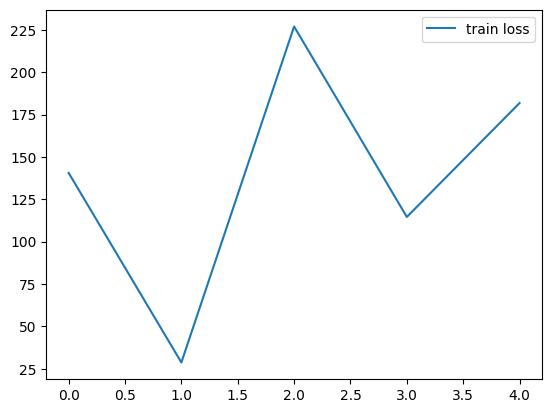

In [28]:
plt.plot(np.arange(len(losses_train)), losses_train, label="train loss")
plt.legend()
plt.show()

# Evaluation

Evaluation follows a slightly different protocol than training. When working with time series, we must be absolutely sure to avoid leaking the future in the data.

If we followed the same protocol of training, one could just read ahead in the `.zarr` and forge a perfect solution at run-time, even for a private test set.

As such, **the private test set for the competition has been "chopped" using the `chop_dataset` function**.

In [29]:
# ===== GENERATE AND LOAD CHOPPED DATASET
num_frames_to_chop = 100
eval_cfg = cfg["val_data_loader"]
eval_base_path = create_chopped_dataset(dm.require(eval_cfg["key"]), cfg["raster_params"]["filter_agents_threshold"],
                              num_frames_to_chop, cfg["model_params"]["future_num_frames"], MIN_FUTURE_STEPS)

/content/l5kit/l5kit/l5kit/data/zarr_utils.py:244: RuntimeWarning: zarr dataset path doesn't exist. Open will fail for this dataset!
  output_dataset = ChunkedDataset(output_zarr)
copying: 100%|██████████| 100/100 [00:02<00:00, 34.47it/s]
/content/l5kit/l5kit/l5kit/evaluation/extract_ground_truth.py:52: RuntimeWarning: you're running with a custom agents_mask
  dataset = AgentDataset(cfg=cfg, zarr_dataset=zarr_dataset, rasterizer=rasterizer, agents_mask=agents_mask)
extracting GT:   0%|          | 0/480 [00:00<?, ?it/s]/content/l5kit/l5kit/l5kit/dataset/utils.py:32: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  torch.ByteTensor(torch.ByteStorage.from_buffer(string.encode("ascii"))),  # type: ignore
extracting GT: 100%|██████████| 480/480 [00:12<00:0

The result is that **each scene has been reduced to only 100 frames**, and **only valid agents in the 100th frame will be used to compute the metrics**. Because following frames in the scene have been chopped off, we can't just look ahead to get the future of those agents.

In this example, we simulate this pipeline by running `chop_dataset` on the validation set. The function stores:
- a new chopped `.zarr` dataset, in which each scene has only the first 100 frames;
- a numpy mask array where only valid agents in the 100th frame are True;
- a ground-truth file with the future coordinates of those agents;

Please note how the total number of frames is now equal to the number of scenes multipled by `num_frames_to_chop`.

The remaining frames in the scene have been sucessfully chopped off from the data

In [30]:
eval_zarr_path = str(Path(eval_base_path) / Path(dm.require(eval_cfg["key"])).name)
eval_mask_path = str(Path(eval_base_path) / "mask.npz")
eval_gt_path = str(Path(eval_base_path) / "gt.csv")

eval_zarr = ChunkedDataset(eval_zarr_path).open()
eval_mask = np.load(eval_mask_path)["arr_0"]
# ===== INIT DATASET AND LOAD MASK
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)
eval_dataloader = DataLoader(eval_dataset, shuffle=eval_cfg["shuffle"], batch_size=eval_cfg["batch_size"],
                             num_workers=eval_cfg["num_workers"])
print(eval_dataset)

+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   10000    |   751440   |     130740    |       0.28      |        100.00        |        75.14         |        10.00         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


<ipython-input-30-e9bd7fad1c60>:8: RuntimeWarning: you're running with a custom agents_mask
  eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)


### Storing Predictions
There is a small catch to be aware of when saving the model predictions. The output of the models are coordinates in `agent` space and we need to convert them into displacements in `world` space.

To do so, we first convert them back into the `world` space and we then subtract the centroid coordinates.

In [31]:
# ==== EVAL LOOP
model.eval()
torch.set_grad_enabled(False)

# store information for evaluation
future_coords_offsets_pd = []
timestamps = []
agent_ids = []

progress_bar = tqdm(eval_dataloader)
for data in progress_bar:
    _, ouputs = forward(data, model, device, criterion)

    # convert agent coordinates into world offsets
    agents_coords = ouputs.cpu().numpy()
    world_from_agents = data["world_from_agent"].numpy()
    centroids = data["centroid"].numpy()
    coords_offset = transform_points(agents_coords, world_from_agents) - centroids[:, None, :2]

    future_coords_offsets_pd.append(np.stack(coords_offset))
    timestamps.append(data["timestamp"].numpy().copy())
    agent_ids.append(data["track_id"].numpy().copy())


100%|██████████| 40/40 [02:40<00:00,  4.02s/it]


### Save results
After the model has predicted trajectories for our evaluation set, we can save them in a `csv` file.

During the competition, only the `.zarr` and the mask will be provided for the private test set evaluation.
Your solution is expected to generate a csv file which will be compared to the ground truth one on a separate server

In [32]:
pred_path = f"{gettempdir()}/pred.csv"

write_pred_csv(pred_path,
               timestamps=np.concatenate(timestamps),
               track_ids=np.concatenate(agent_ids),
               coords=np.concatenate(future_coords_offsets_pd),
              )

100%|██████████| 480/480 [00:00<00:00, 1600.89it/s]


### Perform Evaluation
Pleae note that our metric supports multi-modal predictions (i.e. multiple predictions for a single GT trajectory). In that case, you will need to provide a confidence for each prediction (confidences must all be between 0 and 1 and sum to 1).

In this simple example we don't generate multiple trajectories, so we won't pass any confidences vector. Internally, the metric computation will assume a single trajectory with confidence equal to 1

In [33]:
metrics = compute_metrics_csv(eval_gt_path, pred_path, [neg_multi_log_likelihood, time_displace])
for metric_name, metric_mean in metrics.items():
    print(metric_name, metric_mean)


100%|██████████| 480/480 [00:00<00:00, 2802.97it/s]

neg_multi_log_likelihood 132517.74014501696
time_displace [17.69473231 25.67243646 31.46331291 47.29812748 57.75586966 61.76280558
 64.37772858 66.9669382  69.64217504 70.01226825 73.88848805 70.94211237
 74.12321477 78.45863988 83.13612964 74.63557271 80.42104971 75.12963674
 65.97110599 72.68316828 68.49084359 71.71357875 71.84369883 73.00933606
 74.84283718 69.92190341 66.7749642  69.47446609 67.99414099 65.45876172
 68.88269472 72.54123261 63.47437012 68.28631441 71.7255287  66.62692079
 71.08648993 70.1092645  73.12141063 69.1638203  67.52781944 62.44762921
 67.79027985 58.52999409 65.25523172 64.02964072 66.59077181 60.19729167
 59.35868307 64.58836165]


### Visualise Results
We can also visualise some results from the ego (AV) point of view for those frames of interest (the 100th of each scene).

However, as we chopped off the future from the dataset **we must use the GT csv if we want to plot the future trajectories of the agents**


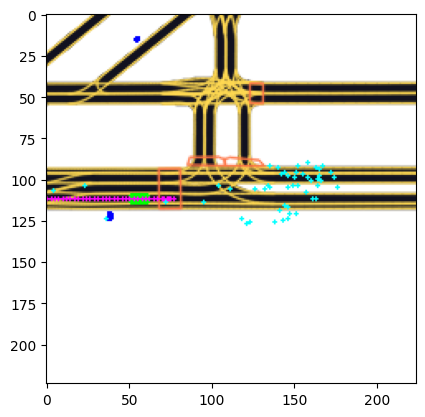

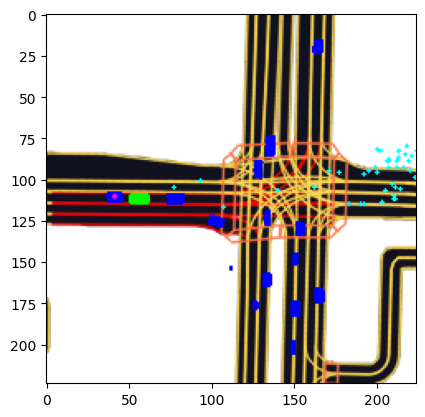

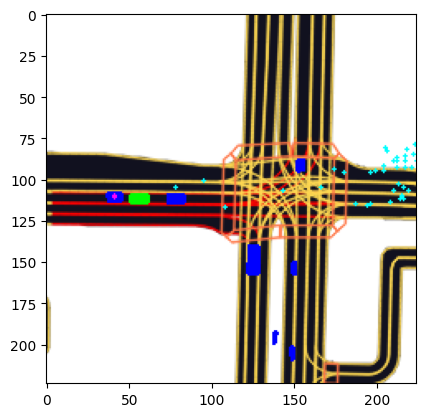

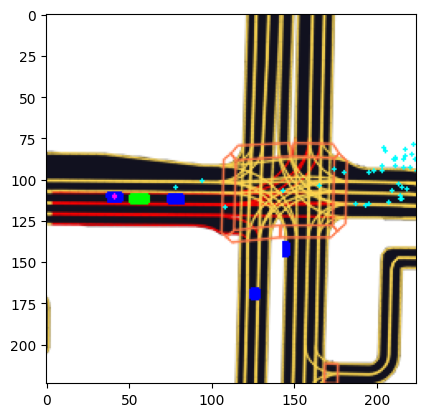

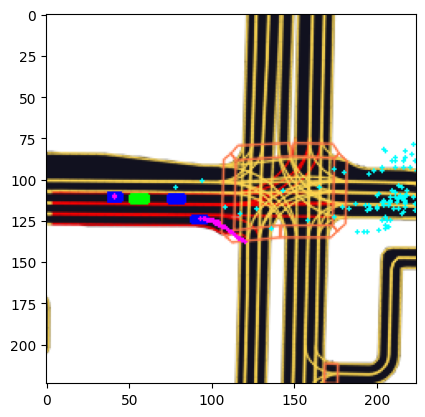

...

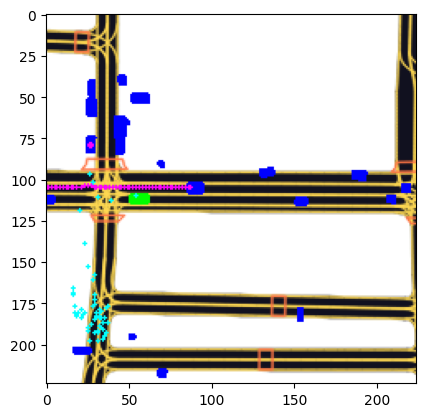

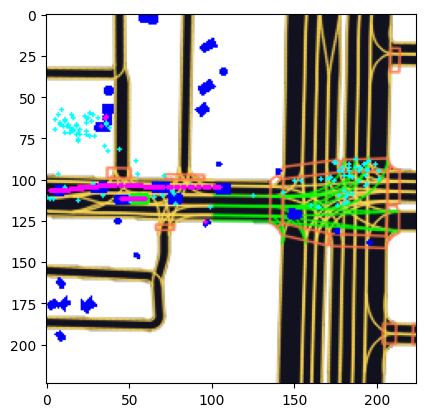

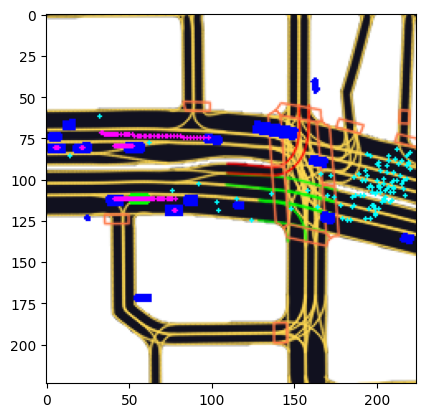

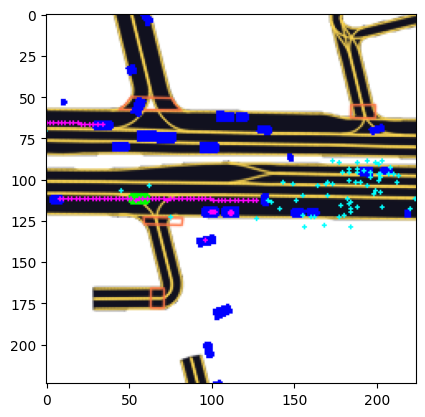

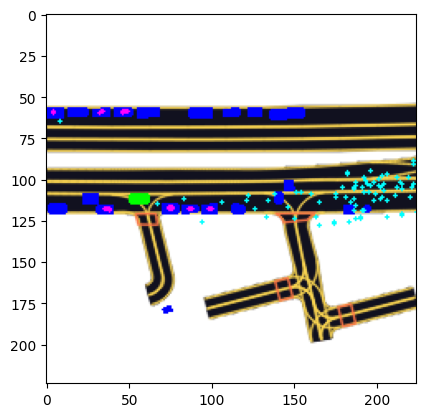

In [34]:
model.eval()
torch.set_grad_enabled(False)

# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_dataset.dataset, rasterizer)

for frame_number in range(99, len(eval_zarr.frames), 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number)
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]

    predicted_positions = []
    target_positions = []

    for v_index in agent_indices:
        data_agent = eval_dataset[v_index]

        out_net = model(torch.from_numpy(data_agent["image"]).unsqueeze(0).to(device))
        out_pos = out_net[0].reshape(-1, 2).detach().cpu().numpy()
        # store absolute world coordinates
        predicted_positions.append(transform_points(out_pos, data_agent["world_from_agent"]))
        # retrieve target positions from the GT and store as absolute coordinates
        track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
        target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])


    # convert coordinates to AV point-of-view so we can draw them
    predicted_positions = transform_points(np.concatenate(predicted_positions), data_ego["raster_from_world"])
    target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])

    draw_trajectory(im_ego, predicted_positions, PREDICTED_POINTS_COLOR)
    draw_trajectory(im_ego, target_positions, TARGET_POINTS_COLOR)

    plt.imshow(im_ego)
    plt.show()